# Исследования рынка общепита в Москве для принятия решения об открытии нового заведения

В рамках проекта проводится исследование рынка общественного питания в Москве с целью открытия заведения. Для инвесторов подготовлена информация о возможности развития сети.

Шаг №1. Загрузка данных и подготовка к анализу

Шаг №2. Предобработка данных

Шаг №3. Анализ данных

Шаг №4. Детализируем исследование: открытие кофейни

## Изучение данных из файла и предобработка

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px 
from plotly import graph_objects as go
from plotly.offline import iplot
import warnings
import folium
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
sns.set(
    font_scale =2,
    style      ='whitegrid',
    rc         ={'figure.figsize':(20,7)}
)
%config InlineBackend.figure_format = 'retina'

pd.set_option('display.float_format', '{:,.2f}'.format)

In [3]:
data = pd.read_csv('/datasets/moscow_places.csv')
data.head(30)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.89,37.51,4.60,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.89,37.52,4.40,средние,Средний счёт:199 ₽,199.00,NaN,0,45.00
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.89,37.52,4.70,средние,Средний счёт:200–300 ₽,250.00,NaN,0,45.00
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.54,4.80,средние,Средний счёт:от 500 ₽,500.00,NaN,0,79.00
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.88,37.52,4.30,средние,Средний счёт:1000–1200 ₽,"1,100.00",NaN,0,65.00


In [4]:
def description(x):
    print('\033[1m' + 'Получение общей информации о данных в таблице:' + '\033[0m')
    display(x.info())
    print('\033[1m' + 'Количество строк и столбцов:' + '\033[0m')
    display(x.shape)
    print('\033[1m' + 'Подсчёт пропусков в таблице:' + '\033[0m')
    display(pd.concat([x.isna().sum(), x.isna().mean()], axis=1)\
    .rename(columns={0:'кол-во', 1:'доля'})\
    .style.format({'кол-во':'{:.0f}', 'доля':'{:.2%}'}))
    print('\033[1m' + 'Наличие дубликатов в таблице:' + '\033[0m')
    display(x.duplicated().sum())
    print('\033[1m' + 'Уникальные значения в таблице:' + '\033[0m')
    display(x.nunique())
    print('\033[1m' + 'Статистические показатели таблицы:' + '\033[0m')
    display(x.describe())

In [5]:
description(data)

Получение общей информации о данных в таблице:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

Количество строк и столбцов:


(8406, 14)

Подсчёт пропусков в таблице:


,кол-во,доля
name,0,0.00%
category,0,0.00%
address,0,0.00%
district,0,0.00%
hours,536,6.38%
lat,0,0.00%
lng,0,0.00%
rating,0,0.00%
price,5091,60.56%
avg_bill,4590,54.60%


Наличие дубликатов в таблице:


0

Уникальные значения в таблице:


name                 5614
category                8
address              5753
district                9
hours                1307
lat                  8209
lng                  8258
rating                 41
price                   4
avg_bill              897
middle_avg_bill       230
middle_coffee_cup      96
chain                   2
seats                 229
dtype: int64

Статистические показатели таблицы:


,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,"8,406.00","8,406.00","8,406.00","3,149.00",535.00,"8,406.00","4,795.00"
mean,55.75,37.61,4.23,958.05,174.72,0.38,108.42
std,0.07,0.10,0.47,"1,009.73",88.95,0.49,122.83
min,55.57,37.36,1.00,0.00,60.00,0.00,0.00
25%,55.71,37.54,4.10,375.00,124.50,0.00,40.00
50%,55.75,37.61,4.30,750.00,169.00,0.00,75.00
75%,55.80,37.66,4.40,"1,250.00",225.00,1.00,140.00
max,55.93,37.87,5.00,"35,000.00","1,568.00",1.00,"1,288.00"


In [6]:
data['address']=data['address'].str.lower()
data['name']=data['name'].str.lower()
duplicateRows = data[data.duplicated(['name', 'address'])]
duplicateRows

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.53,3.20,NaN,NaN,NaN,NaN,0,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.81,37.50,4.20,NaN,NaN,NaN,NaN,1,188.00
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.81,37.64,4.40,NaN,NaN,NaN,NaN,1,150.00
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.74,37.41,4.10,NaN,NaN,NaN,NaN,0,276.00


In [7]:
data=data.drop_duplicates(subset=['name', 'address'], keep='first')
data.shape[0]

8402

In [8]:
data.category.unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

В таблице data, имеющей 8406 строк, содержится 14 колонок:

name — название заведения;

address — адрес заведения;

category — категория заведения, например «кафе», «пиццерия» или «кофейня»;

hours — информация о днях и часах работы;

lat — широта географической точки, в которой находится заведение;

lng — долгота географической точки, в которой находится заведение;

rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона

middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым

district — административный район, в котором находится заведение, например Центральный административный округ;

seats — количество посадочных мест.

Все идентификаторы объекта уникальные. Но ряд предпрятий расположены по одному и тому же адресу.

Всего 8 типов общественного питания:
кафе;
 ресторан;
 кофейня;
 пиццерия;
 бар,паб;
 быстрое питание;
 булочная;
 столовая;

## Предобработка данных

### Создание столбца с названием улицы 

In [9]:
import warnings
warnings.filterwarnings("ignore")

data['street'] = data["address"].str.split(', ').str[1]

### Добавление столбца для обозначения круглосуточных заведений

In [10]:
def is24(row):
    if row['hours']=='ежедневно, круглосуточно':
        return(True)
    else:
        return(False)
data['is_24/7']=data.apply(is24,axis=1)
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00,правобережная улица,False


## Анализ данных

### Количество объектов общественного питания по категориям

In [11]:
category = data.category.value_counts().reset_index()

category

,index,category
0,кафе,2376
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


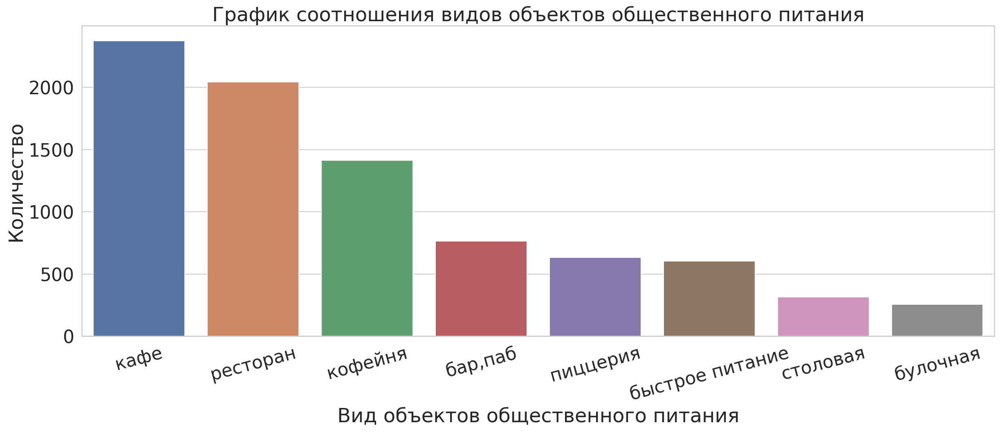

In [12]:
sns.barplot(x='index', y=category.category, data=category) 

plt.ylabel('Количество')
plt.xlabel('Вид объектов общественного питания')
plt.title('График соотношения видов объектов общественного питания')
plt.xticks(rotation=15);

In [13]:
go.Figure(data=[go.Pie(labels=category['index'], values=category.category)])

Самые распространенные виды объекта общественного питания - это кафе (2378, или 28,3%), ресторан (2043, или 24,3%). Наименее распространенные - столовая (315, или 3,7%) и булочная (256, или 3%).

### Количество посадочных мест в местах по категориям

In [14]:
number_mean = data.groupby('category').agg({'seats': 'mean'}) \
                       .sort_values(by='seats', ascending=False).reset_index()
number_mean

,category,seats
0,"бар,паб",124.48
1,ресторан,121.89
2,кофейня,111.20
3,столовая,99.75
4,быстрое питание,98.89
5,кафе,97.37
6,пиццерия,94.50
7,булочная,89.39


In [15]:
number_mean = data.groupby('category').agg({'seats': 'median'}) \
                       .sort_values(by='seats', ascending=False).reset_index()
number_mean

,category,seats
0,ресторан,86.00
1,"бар,паб",82.00
2,кофейня,80.00
3,столовая,75.50
4,быстрое питание,65.00
5,кафе,60.00
6,пиццерия,55.00
7,булочная,50.00


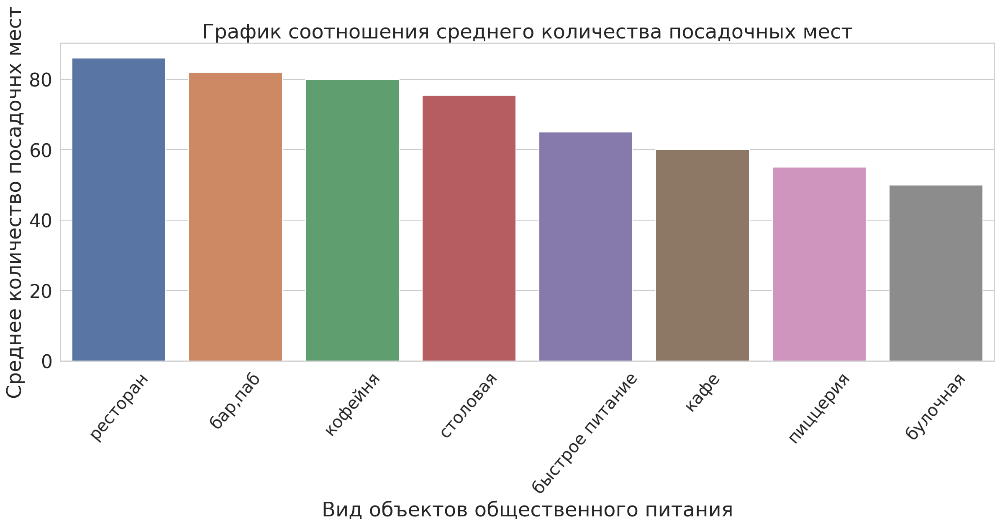

In [16]:
sns.barplot(x=number_mean.category, y=number_mean.seats, data=number_mean) 

plt.ylabel('Среднее количество посадочнх мест')
plt.xlabel('Вид объектов общественного питания')
plt.title('График соотношения среднего количества посадочных мест')
plt.tick_params(axis='x', labelsize=20)
plt.xticks(rotation=50);

В среднем самое большое количество посадочных мест предоставляют:

* бары - 125
* рестораны - 122
* кофейни - 111

Меньше всего - пиццерии - 95 и булочные - 89

Медианное значение ниже вышеперечисленных данных по всем видам.

### Cоотношение сетевых и несетевых заведений в датасете.

In [17]:
data.chain.value_counts()

0    5199
1    3203
Name: chain, dtype: int64

In [18]:
round(data.chain.value_counts(normalize=True), 4)

0   0.62
1   0.38
Name: chain, dtype: float64

In [19]:
data.groupby(['category', 'chain'])['chain'].agg({'count'}) \
         .sort_values(by='count', ascending=False)

count
category        chain       
кафе            0       1597
ресторан        0       1313
кафе            1        779
ресторан        1        729
кофейня         1        720
                0        693
бар,паб         0        596
быстрое питание 0        371
пиццерия        1        330
                0        303
быстрое питание 1        232
столовая        0        227
бар,паб         1        168
булочная        1        157
                0         99
столовая        1         88

In [20]:
data.groupby(['category', 'chain'])['chain'].agg({'count'}) \
         .sort_values(by='count', ascending=False).apply(lambda x:100 * x / float(x.sum()))

count
category        chain       
кафе            0      19.01
ресторан        0      15.63
кафе            1       9.27
ресторан        1       8.68
кофейня         1       8.57
                0       8.25
бар,паб         0       7.09
быстрое питание 0       4.42
пиццерия        1       3.93
                0       3.61
быстрое питание 1       2.76
столовая        0       2.70
бар,паб         1       2.00
булочная        1       1.87
                0       1.18
столовая        1       1.05

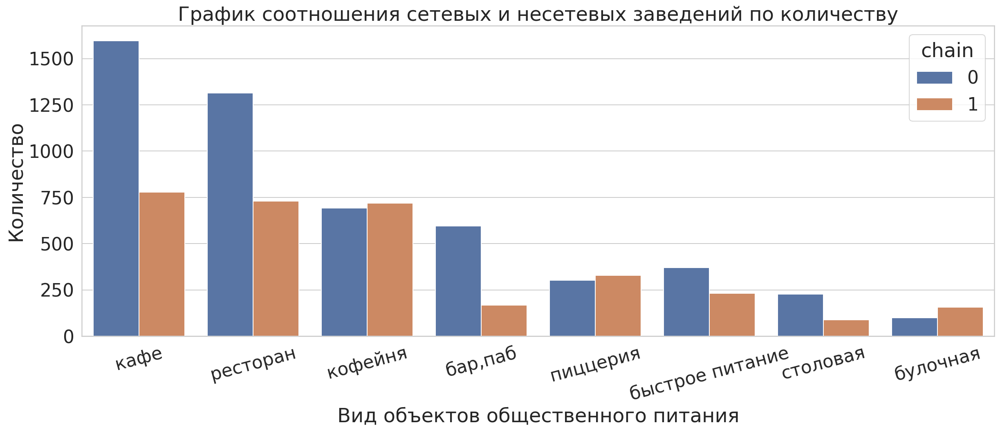

In [21]:
sns.countplot(x="category", data=data, hue='chain',  
              order = data['category'].value_counts().index)

plt.ylabel('Количество')
plt.xlabel('Вид объектов общественного питания')
plt.title('График соотношения сетевых и несетевых заведений по количеству')
plt.xticks(rotation=15);

Из 8406 объектов 3205, или 38% являются сетевыми. Самыми популярными заведениями являются несетевые кафе и рестораны (19% и 15,6% соответсвенно).Они же являются самыми популярными и в сетевом секторе (9,3% и 8,7%). Сетевые столовые являются самыми редкими (1%)

### Топ-15 популярных сетей в Москве

In [22]:
data.groupby(['name']).agg({'chain':'count','category':'first'}) \
         .sort_values(by='chain', ascending=False).head(15)

,chain,category
name,,
кафе,188,кафе
шоколадница,120,кофейня
домино'с пицца,77,пиццерия
додо пицца,74,пиццерия
one price coffee,72,кофейня
яндекс лавка,69,ресторан
cofix,65,кофейня
prime,50,ресторан
хинкальная,44,быстрое питание


В топ 15 популярных сетей присутвуют заведений которые не являются сетевыми, а просто имеют стандартное название. Их необходимо исключить 

In [23]:
names=['Кафе','Хинкальная','Шаурма','Чайхана','Ресторан','Столовая']
data2=data.query('name !=@names')
data2=data2.groupby(['name']).agg({'chain':'count','category':'first'}) \
         .sort_values(by='chain', ascending=False).head(15)
data2.columns=['count','category']
data2

,count,category
name,,
кафе,188,кафе
шоколадница,120,кофейня
домино'с пицца,77,пиццерия
додо пицца,74,пиццерия
one price coffee,72,кофейня
яндекс лавка,69,ресторан
cofix,65,кофейня
prime,50,ресторан
хинкальная,44,быстрое питание


In [24]:
data2=data2.groupby(['category']).agg({'count':'sum'}).sort_values(by='count', ascending=False)
data2

,count
category,
кофейня,299
кафе,264
ресторан,191
пиццерия,151
быстрое питание,87


Text(0.5, 1.0, 'Распределение типов заведений в топ 15')

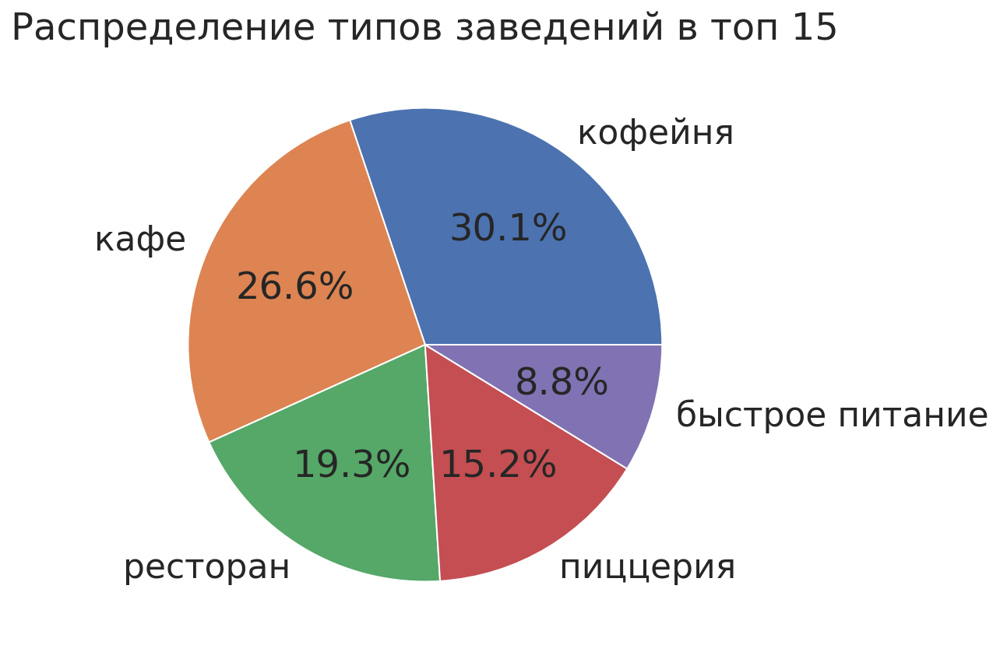

In [25]:
data2['count'].plot(kind='pie',figsize=(7,7), autopct='%1.1f%%')
plt.ylabel('')
plt.title("Распределение типов заведений в топ 15")

Среди самых больших сетей наиболее популярными являются кофейни (45,1%), на мой взгляд причина подавляющего большинства в том, что кофейни не требуют больших финансовых вложений и при этом имеют стабильную посещаемость. Так же в сетевых форматах распространены рестораны, пицеерии и кафе (50,8% в сумме). Они вместе с кофейнями составляют 96% всех крупных сетей.

### Административные районы Москвы

In [26]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [27]:
data.groupby(['district']).agg({'chain':'sum'}).sort_values(by='chain',ascending=False)\
.rename(columns={'chain':'count'})

,count
district,
Центральный административный округ,875
Западный административный округ,376
Северный административный округ,346
Северо-Восточный административный округ,333
Южный административный округ,312
Юго-Западный административный округ,302
Восточный административный округ,283
Юго-Восточный административный округ,220
Северо-Западный административный округ,156


In [28]:
data2=data.groupby(['district','category']).agg({'chain':'count'}).sort_values(['district','chain'],ascending=False)\
.rename(columns={'chain':'count'})
data2

count
district                                category              
Южный административный округ            кафе               264
                                        ресторан           202
                                        кофейня            131
                                        быстрое питание     85
                                        пиццерия            73
                                        бар,паб             68
                                        столовая            44
                                        булочная            25
Юго-Западный административный округ     кафе               238
                                        ресторан           168
                                        кофейня             96
                                        пиццерия            64
                                        быстрое питание     61
                                        бар,паб             38
                                        булочная            27
                                        столовая            17
Юго-Восточный административный округ    кафе               282
                                        ресторан           145
                                        кофейня             89
                                        быстрое питание     67
                                        пиццерия            55
                                        бар,паб             38
                                        столовая            25
                                        булочная            13
Центральный административный округ      ресторан           670
                                        кафе               464
                                        кофейня            428
                                        бар,паб            364
                                        пиццерия           113
                                        быстрое питание     87
                                        столовая            66
                                        булочная            50
Северо-Западный административный округ  кафе               115
                                        ресторан           109
                                        кофейня             62
                                        пиццерия            40
                                        быстрое питание     30
                                        бар,паб             23
                                        столовая            18
                                        булочная            12
Северо-Восточный административный округ кафе               269
                                        ресторан           182
                                        кофейня            159
                                        быстрое питание     82
                                        пиццерия            68
                                        бар,паб             62
                                        столовая            40
                                        булочная            28
Северный административный округ         кафе               234
                                        кофейня            193
                                        ресторан           188
                                        пиццерия            77
                                        бар,паб             68
                                        быстрое питание     58
                                        столовая            41
                                        булочная            39
Западный административный округ         кафе               238
                                        ресторан           218
                                        кофейня            150
                                        пиццерия            71
                                        быстрое питание     62
                                        бар,паб             50
                         

In [29]:
data2.columns=['_'.join(str(s).strip() for s in col if s) for col in data2.columns ]
data2.reset_index(inplace= True )
data2.columns=['Округ','Категория','Кол-во']

In [30]:
data2=data2.sort_values(by='Кол-во', ascending=False)

In [31]:
data2=data2.sort_values(by='Кол-во', ascending=False)
fig = px.bar(data2, x="Округ", y="Кол-во", color="Категория",
            hover_data=['Категория'], barmode = 'stack')
 
fig.show()

### Средние рейтинги

In [32]:
data2=data.groupby('category').agg({'rating':'mean'}).sort_values(by='rating', ascending=False)
data2

,rating
category,
"бар,паб",4.39
пиццерия,4.30
ресторан,4.29
кофейня,4.28
булочная,4.27
столовая,4.21
кафе,4.12
быстрое питание,4.05


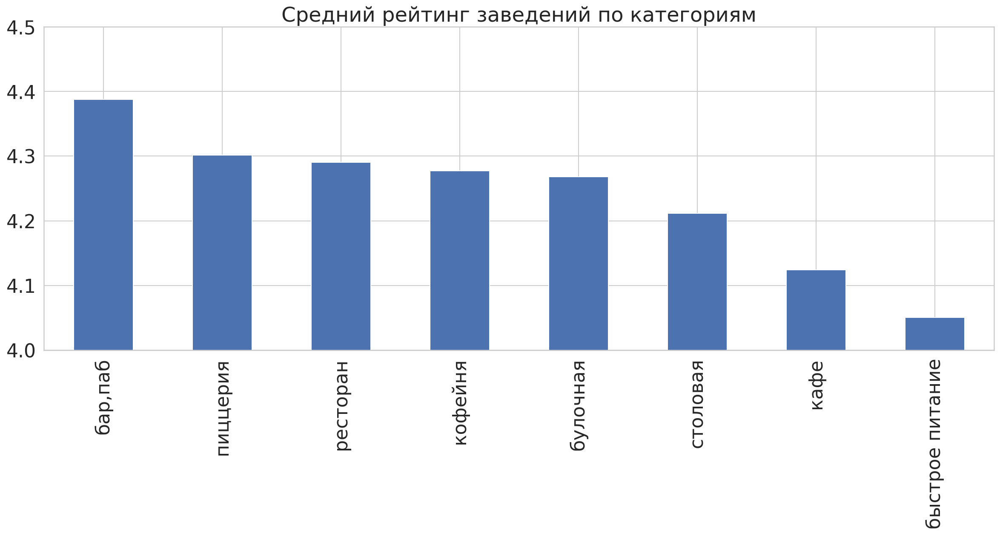

In [33]:
data2['rating'].plot(kind='bar')
plt.title("Средний рейтинг заведений по категориям")
plt.ylim(4,4.5)
plt.xlabel('')
plt.show()

При относительно одинаковом среднем рейтинге по категориям можно выделить только падения рейтинга у кафе и быстрого питания (4.12 и 4.05) и небольшой рост у баров/пабов (4.39)

### Средний рейтинг по районам на карте

In [34]:

state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)
m

### Карта всех заведений

In [35]:

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)
m

### Топ-15 улиц по количеству заведений

In [36]:
street_top15 = data.groupby('street').agg({'chain': 'count'}) \
                       .sort_values(by='chain', ascending=False).reset_index().head(15)
street_top15.columns=['street','count']
street=street_top15['street']
street_top15

,street,count
0,проспект мира,183
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


In [37]:
data2=data.query('street in @street')
data2=data2.groupby(['street','category']).agg({'chain':'count'}).sort_values(['street','chain'],ascending=False)\
.rename(columns={'chain':'count'})
data2.columns=['_'.join(str(s).strip() for s in col if s) for col in data2.columns ]
data2.reset_index(inplace= True )
data2.columns=['Улица','Категория','Кол-во']
fig = px.sunburst(data2, path=['Улица','Категория'], values='Кол-во')
fig.show()

<div class="alert alert-success">
<b>Комментарий ревьюера:</b>☀️
    
* Любопытные отличия некоторых улиц по составу заведений, так например на МКАДе не так много баров-пабов, что в принципе логично
* Обращаю внимание, что дело в длине этих улиц, часть из них выдают такое большое число заведений именно за счёт длины </div>

### Улицы с одним объектом общепита

In [38]:
street_1 = data.groupby(['street','category','district']).agg({'chain': 'count'}) \
                       .sort_values(by='chain', ascending=True).reset_index().head(515)
street_1.columns=['street','category','district','count']
street_1=street_1.query('count==1')
street_1

,street,category,district,count
0,1-й автозаводский проезд,кафе,Южный административный округ,1
1,проектируемый проезд № 4062,ресторан,Южный административный округ,1
2,проектируемый проезд № 5265,ресторан,Северный административный округ,1
3,пролетарский проспект,"бар,паб",Южный административный округ,1
4,промышленный проезд,кафе,Западный административный округ,1
5,пронская улица,пиццерия,Юго-Восточный административный округ,1
6,проспект 60-летия октября,кофейня,Юго-Западный административный округ,1
7,проспект 60-летия октября,пиццерия,Юго-Западный административный округ,1
8,проспект академика сахарова,ресторан,Центральный административный округ,1
9,проезд якушкина,ресторан,Северо-Восточный административный округ,1


In [39]:
street_1.groupby('category').agg({'count':'sum'}).sort_values(by='count', ascending=False)

,count
category,
кафе,103
ресторан,87
кофейня,85
"бар,паб",70
быстрое питание,53
пиццерия,49
столовая,35
булочная,33


In [40]:
street_1.shape[0]

515

In [41]:
discard = ["переулок",'тупик','проезд','мост']
street_1_new=street_1[~street_1.street.str.contains('|'.join(discard))]
street_1_new.shape[0]

371

In [42]:
street_1.groupby('district').agg({'count':'sum'}).sort_values(by='count', ascending=False)

,count
district,
Центральный административный округ,170
Восточный административный округ,74
Северо-Восточный административный округ,56
Южный административный округ,49
Северный административный округ,45
Западный административный округ,42
Юго-Восточный административный округ,29
Юго-Западный административный округ,29
Северо-Западный административный округ,21


В основном улицы с одним заведением являются маленькими улицами (переулки, проезды). Так же на таких улицах гораздо реже встречаются специализированные и премиальные заведения (рестораны, пиццерии). Большинство таких улиц находится в центральном административном округе 

### Исследование средних чеков заведений

In [43]:
data2=data.groupby('district').agg({'middle_avg_bill':'median'}).sort_values(by='middle_avg_bill')
data2

,middle_avg_bill
district,
Юго-Восточный административный округ,450.00
Северо-Восточный административный округ,500.00
Южный административный округ,500.00
Восточный административный округ,575.00
Юго-Западный административный округ,600.00
Северный административный округ,650.00
Северо-Западный административный округ,700.00
Западный административный округ,"1,000.00"
Центральный административный округ,"1,000.00"


In [44]:
data2.columns=['_'.join(str(s).strip() for s in col if s) for col in data2.columns ]
data2.reset_index(inplace= True )
data2.columns=['Район','Ср. счет']
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=data2,
    columns=['Район', 'Ср. счет'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='Средний счет заведений по районам',
).add_to(m)
m

Наибольший средний чек наблюдается в ЗАО и ЦАО. Исходя из карты средний чек корелирует со стоимостью недвижимости в соответвующих районах

## Общий вывод

Кафе занимают самую большую долю среди видов объекта общественного питания - 28,3%.

38% объектов являются сетевыми. Среди сетевых объектов доминируют кафе, рестораны и кофейни (9%, 8,6% и 8,5% от общего числа заведений соответственно). Столовые занимают последнее место (всего 1,05%).

Топ-15 улиц, где расположено наибольшее количество объектов общественного питания, находятся чаще всего в ЦАО и ВАО, а именно на проспекте Мира, Профсоюзной улице, проспекте Вернадского

В рамках исследования обнаружено 515 улиц, где расположен всего один объект общественного питания. Как правило, это улицы в пределах ЦАО и ВАО.

Средние чеки ожидаемо выше в округах с высокой стоимостью недвижимости (ЦАО и ЗАО)

Средние рейтинги завдений заметно ниже в южных и восточных округах города

## Детализируем исследование: открытие кофейни

### Особенности расположения кофеен 

In [45]:
data.loc[data['category']=='кофейня'].count()[0]

1413

In [46]:
data2=data.loc[data['category']=='кофейня']
data2

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица маршала федоренко,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.88,37.46,4.30,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.89,37.51,4.00,NaN,NaN,NaN,NaN,1,46.00,коровинское шоссе,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.88,37.49,3.60,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко,False
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.88,37.48,3.80,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,False
53,royal coffee,кофейня,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,3.10,NaN,NaN,NaN,NaN,0,148.00,правобережная улица,False
58,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.90,37.57,4.10,средние,Средний счёт:500–800 ₽,650.00,NaN,1,NaN,угличская улица,False
60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.90,37.57,4.90,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник лианозовский,False
64,testo мания,кофейня,"москва, лианозовский парк культуры и отдыха",Северо-Восточный административный округ,"ежедневно, 09:00–21:00",55.90,37.57,4.10,NaN,NaN,NaN,NaN,0,NaN,лианозовский парк культуры и отдыха,False
66,молинари,кофейня,"москва, алтуфьевское шоссе, 70, корп. 1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.89,37.59,4.80,NaN,NaN,NaN,NaN,0,120.00,алтуфьевское шоссе,False


In [47]:
data2.groupby('district').agg({'chain':'count'}).sort_values(by='chain', ascending=False)

,chain
district,
Центральный административный округ,428
Северный административный округ,193
Северо-Восточный административный округ,159
Западный административный округ,150
Южный административный округ,131
Восточный административный округ,105
Юго-Западный административный округ,96
Юго-Восточный административный округ,89
Северо-Западный административный округ,62


In [48]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data2.apply(create_clusters, axis=1)
m

Наибольшее число кофеен расположено в ЦАО. Это вызвано тем, что в центре присутвует множество достопримечательностей и пешеходных улиц которые способствуют выручке кофеен. Для открытия новой кофейни предлагаю рассматривать ЮАО, ВАО, ЮЗАО. Это округа с самым большим населением, но при этом находятся внизу списка по числу открытых заведений.

Text(0.5, 1.0, 'Доля круглосуточных кофеен (оранжевый)')

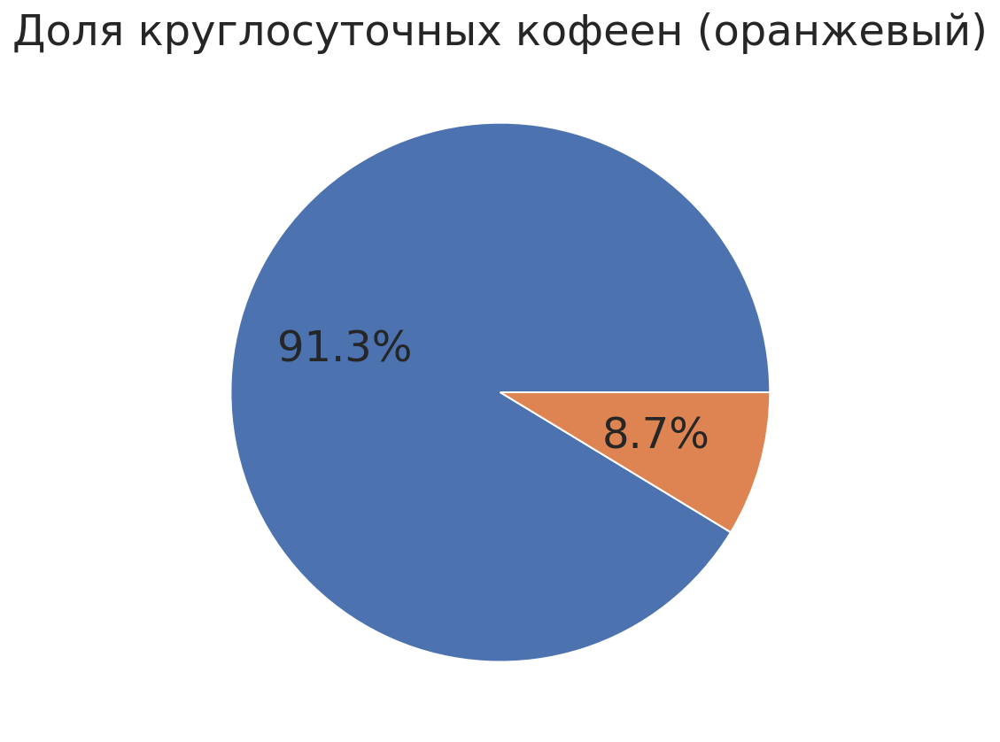

In [49]:
data2.loc[data2['is_24/7']==True].count()[0]
plt.pie(data.groupby('is_24/7')['is_24/7'].count(),  autopct='%1.1f%%')
plt.title('Доля круглосуточных кофеен (оранжевый)')

Число круглосуточных кофеен очень мало (около 9% от общего числа). Не вижус смысла открывать круглосуточную кофейню, так как кофейные напитки в основном употребляют в определенные часы (утром и днем)

In [50]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=data2,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)
m

Южные и восточные округа имеет наименьший средний рейтинг у заведений. Это может стать полезным при открытие новой кофейни, так как при открытии качественного заведения будет меньше конкуренция.

In [51]:
data2=data2.groupby('district').agg({'middle_avg_bill':'median'}).sort_values(by='middle_avg_bill', ascending=False)
data2

,middle_avg_bill
district,
Западный административный округ,600.00
Центральный административный округ,500.00
Восточный административный округ,400.00
Южный административный округ,387.50
Юго-Западный административный округ,375.00
Северный административный округ,325.00
Северо-Восточный административный округ,325.00
Северо-Западный административный округ,325.00
Юго-Восточный административный округ,250.00


Если ориентироваться на открытие кофени в ЮАО, ВАО, ЮЗАО, то стоимость чашки капучино желательно должна находиться в промежутке 250-400 рублей.

### Вывод

Для открытия новой кофени я бы рекомендовал рассмотреть южные и восточные округа Москвы. В них не такая большая конкуренция и исходя их рейтингов очень мало качественных кофеен и при этом там проживает большая часть населения. С точки зрения цены за чашку кофе выгоднее будет развитие в южном напривалении так как жители привыкли к большему среденму чеку за кофе

https://drive.google.com/file/d/121fX8hAKFlfUg8fAMgwbqNECXS-23lcn/view?usp=sharing